# Analysing the Datasets
The datasets underwent quantitative and qualitative analysis prior to the classification.

The quantitative analysis included an inspection of the class distributions, of the text lengths of titles and abstracts, and of the number of duplicates per dataset. The datasets were qualitatively analyzed by manually scanning through articles and pairs of duplicate articles and looking for patterns. The qualitative analysis surrounds the types of duplicate article pairs, distinct types of noise, and word cloud analysis.

## Preparation
### Imports

In [1]:
import polars as pl, pandas as pd # dataframes
import seaborn.objects as so, matplotlib.pyplot as plt # plotting
from typing import List, Tuple # type hints
from src import data # helper functions
import re # regular expressions
from nltk.stem import WordNetLemmatizer # lemmatization
from wordcloud import WordCloud, ImageColorGenerator # wordclouds
from nltk.corpus import stopwords # stopwords
import nltk # natural language processing toolkit
from nltk.tokenize import word_tokenize # tokenization
import random # randomization
import matplotlib.pyplot as plt # plotting

### Loading the Data

In [2]:
# where to load the data from
# we are analyzing the data prior to the preprocessing
data_directory = '../../../../data/datasets/03_pubmed'

# load datasets in polars (default) and pandas
datasets = data.dict_from_directory(
    data_directory, 
    type='polars',
    with_index=True
)
datasets_pandas = data.dict_from_directory(data_directory, type='pandas')

In [3]:
# to quickly access the dataframes which live in the dictionary
adhd = datasets['adhd']
animal_depression = datasets['animal_depression']
atypical_antipsychotics = datasets['atypical_antipsychotics']
calcium_channel_blockers = datasets['calcium_channel_blockers']
oral_hypoglycemics = datasets['oral_hypoglycemics']
pancreatic_surgery = datasets['pancreatic_surgery']

# combine all datasets
all_datasets = pl.DataFrame(
)

for subject, dataset in datasets.items():
    all_datasets = all_datasets.vstack(dataset.with_columns(pl.lit(subject).alias('dataset')))

### Helper Functions

In [4]:
# return a selection of rows from a dataframe based on indices and columns
def return_rows(
    df: pl.DataFrame,
    index: List[int] | int,
    columns: List[str] | str = 'abstract'
    ) -> pl.DataFrame:
        return df.filter(
            pl.col('index').is_in(index)
        ).select(columns)

# print abstracts based on given dataframes and indices
def print_abstracts(
        rows: List[Tuple[pl.DataFrame, List[int]]],
        columns: List[str] | str = 'abstract',
        character_limit: int | None = 200,
        abstract_only=True
    ) -> None:

    for row in rows:
        abstracts = return_rows(row[0], row[1], columns)

        if abstract_only:
            abstracts = abstracts['abstract']

        for abstract in abstracts:
            print(abstract[:character_limit], end='\n\n')

# from a list of colors used in the thesis, return a random color
# arguments are required as per the word_cloud package
def get_random_color(word=None, 
                     font_size=None, 
                     position=None, 
                     orientation=None, 
                     font_path=None, 
                     random_state=None
                    ) -> str:
    colors: List[str] = [
     '#004A71', '#009EE0', '#EC963E', '#34B2A6'
     ]
    return random.choice(colors)

# word_cloud_from_dataframe requires the nltk stopwords
nltk.download('stopwords')
nltk.download('wordnet')

# create a word based on a given dataframe and columns
def word_cloud_from_dataframe(
          dataframe: pd.DataFrame, 
          columns=List[str]
        ) -> WordCloud:
    
    corpus = ' '.join(
        [word for column in columns for word in dataframe[column] 
        if word is not None]
    )

    # stop words
    stop_words = stopwords.words('english')  # nltk stopwords

    # add special characters to the list of stop words
    special_characters = ['.', ',', '(', ')', '[', ']', '{', '}', ':', ';',
                          '?', '!', '@', '#', '$', '%', '^', '&', '*', '+', 
                          '=', '<', '>', '/', '\\', '|', '~', '`', '_', '-'
                          ]
    stop_words.extend(special_characters)

    # stop words that frequently appear in the datasets but not in nltk
    custom_stop_words = ['patient', 'treatment', 'study', 'group', 'effect', 
                         'p', 'mg', 'conclusion', 'day', 'week', 'result', 
                         'compared', 'use', 'one', 'also', 'two', 'may', 
                         'level', 'however', 'm', 'd', 'period', 'n'
                        ]
    stop_words.extend(custom_stop_words)

    # tokenization
    word_tokens = word_tokenize(corpus.lower())

    # remove stop words
    filtered = [word for word in word_tokens if word not in stop_words]

    # lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized = [lemmatizer.lemmatize(word) for word in filtered]

    # list of colors used in the thesis
    colors = ['#004A71', '#009EE0', '#EC963E', '#34B2A6']

    return WordCloud(
        scale=20, # size of the word cloud
        collocations=False,  # whether to includes bigrams
        background_color=None, # transparent background
        stopwords=custom_stop_words, 
        mode='RGBA', # transparent background
        color_func=get_random_color
    ).generate_from_text(' '.join(lemmatized)) # generate the word cloud

# display a word cloud together with a title
def plot_word_cloud(cloud, title=''):
    plt.figure(figsize=(10, 10), dpi=400)
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\root\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\root\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Distribution of Class Labels

In [5]:
# color codes
COLOR_CODES = ['#004A71', '#009EE0', '#EC963E', '#34B2A6', '#797B7F', '#2CA02C']

In [6]:
# create lists of inlcudes and excludes
includes = [dataset.filter(
    pl.col('include') == True
) for dataset in datasets.values()]

excludes = [dataset.filter(
    pl.col('include') == False
) for dataset in datasets.values()]

# calculate absolute and relative number of includes and excludes
includes_absolute = [len(include) for include in includes]
excludes_absolute = [len(exclude) for exclude in excludes]

includes_relative = [round(include / len(dataset), 4) * 100 for include, dataset in zip(includes_absolute, datasets.values())]
excludes_relative = [round(exclude / len(dataset), 4) * 100 for exclude, dataset in zip(excludes_absolute, datasets.values())]

In [7]:
# organize the label distributions in a DataFrame
distributions = pl.DataFrame({
    'dataset': list(datasets.keys()),
    'include %': includes_relative,
    'exclude %': excludes_relative,
    'include': includes_absolute,
    'exclude': excludes_absolute,
    'rows': [len(dataset) for dataset in datasets.values()],
})

In [8]:
dataset_labels = [
    'ADHD', 
    'Animal Depression', 
    'Atypical Antipsychotics', 
    'Calcium Channel Blockers', 
    'Oral Hypoglycemics', 
    'Pancreatic Surgery'
]

In [9]:
# create separate rows for each include and exclude
melted = distributions.unpivot(
    index=['dataset'], 
    on=['include %', 'exclude %'],
).sort(by='value')

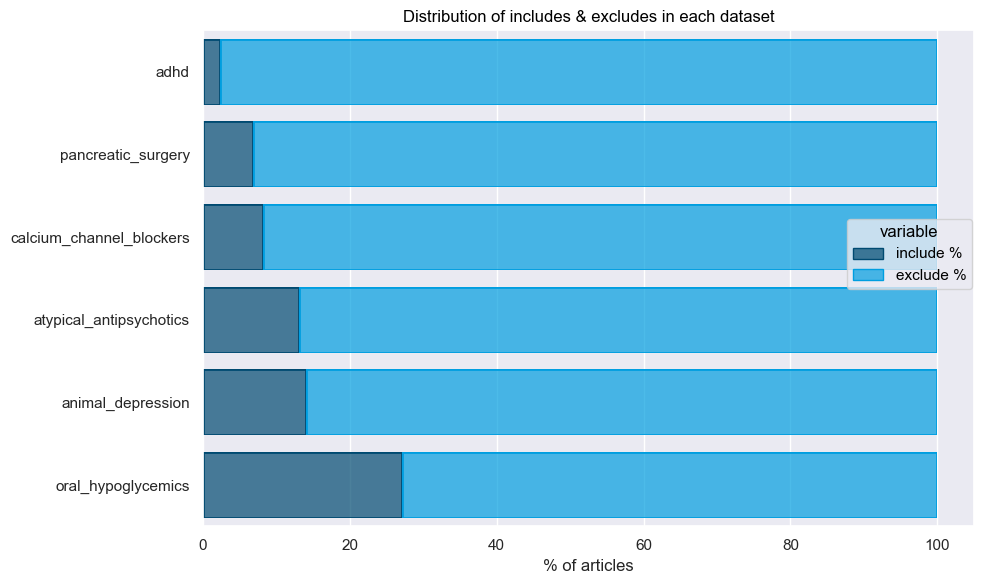

dataset,include %,exclude %,include,exclude,rows
str,f64,f64,i64,i64,i64
"""adhd""",2.35,97.65,20,831,851
"""pancreatic_surgery""",6.88,93.12,2353,31853,34206
"""calcium_channel_blockers""",8.21,91.79,100,1118,1218
"""atypical_antipsychotics""",13.04,86.96,146,974,1120
"""animal_depression""",14.05,85.95,280,1713,1993
"""oral_hypoglycemics""",27.04,72.96,136,367,503


<Figure size 640x480 with 0 Axes>

In [10]:
# plot the distributions of includes and excludes per dataset
plot = (
    so.Plot(data=melted, y='dataset', x='value', color='variable')
    .add(so.Bar(), so.Stack())
    .label(
        y='', 
        x='% of articles', 
        title='Distribution of includes & excludes in each dataset'
    )
    .layout(size=(10, 6))
    .scale(color=COLOR_CODES[:2])
)

# show the plot in this notebook
plot.show()

# save the plot to a file
plt.savefig('includes_excludes.svg', dpi=300)

# show the sorted distributions as a table
distributions.sort(by=pl.col('include %'))

### Conclusion: Class Labels
Title/Abstract-screening is a heavily imbalanced task. The datasets provide a variety of include ratios, ranging from 2 to 27 percent.

## Text Lengths (Number of Words)

In [11]:
# helper function to calculate the length of text within given columns
def calculate_distributions(
        dataframe: pl.DataFrame, # dataframe to analyze
        subject:str, # the topic of the dataset
        columns: str | List[str] # columns to analyze
    ) -> pl.DataFrame:
    """
    Calculate the distribution of the columns in the DataFrame.
    """

    # create an empty dataframe with columns for the distributions
    distributions = pd.DataFrame(
        columns=[
            'column', 
            'type', 
            'n', 
            'mean', 
            'std', 
            'min', 
            '5%', 
            '25%', 
            '50%', 
            '75%', 
            '95%', 
            '99%', 
            'max', 
            'dataset']) 
    
    # number of articles in the dataset
    n = len(dataframe)


    for column in columns:
        # tokenize each column
        tokens = [word_tokenize(x) if pd.notnull(x) else [] 
                  for x in dataframe[column]]

        # create a list of the lengths of the tokens
        word_lengths = pd.Series([len(x) for x in tokens])

        # calculate mean, standard deviation, min, quantiles, and max
        mean = int(word_lengths.mean())
        std = int(word_lengths.std())
        min = int(word_lengths.min())
        q5 = int(word_lengths.quantile(0.05))
        q25 = int(word_lengths.quantile(0.25))
        q50 = int(word_lengths.quantile(0.50))
        q75 = int(word_lengths.quantile(0.75))
        q95 = int(word_lengths.quantile(0.95))
        q99 = int(word_lengths.quantile(0.99))
        max = int(word_lengths.max())
        
        # create a summary of the distribution
        summary = pd.Series(
            [
                column, 
                'word_count', 
                n, 
                mean, 
                std, 
                min, 
                q5, 
                q25, 
                q50, 
                q75, 
                q95, 
                q99, 
                max, 
                subject
            ], 
            index=distributions.columns
        )

        # append the summary to the distributions
        distributions = pd.concat([distributions, summary.to_frame().T])


    return distributions

Calculate the text lengths for all datasets by the helper function:

In [12]:
# create an empty DataFrame to store the distributions
distributions = pd.DataFrame(
    columns = ['column', 
               'type', 
               'n', 
               'mean', 
               'std', 
               'min', 
               '5%', 
               '25%', 
               '50%', 
               '75%', 
               '95%', 
               '99%', 
               'max', 
               'dataset'
               ]
            )

# calculate the distributions for each dataset and add them to one DataFrame
for subject, dataset in datasets.items():
    dist = calculate_distributions(dataset, subject, ['title', 'abstract'])
    
    distributions = pd.concat([distributions, dist])

distributions = pl.DataFrame(distributions)

### Lengths of Titles

In [13]:
# inspect the distributions for the title column
distributions.filter(
    pl.col('column') == 'title'
)

column,type,n,mean,std,min,5%,25%,50%,75%,95%,99%,max,dataset
str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str
"""title""","""word_count""",851,13,5,1,5,10,13,17,23,29,47,"""adhd"""
"""title""","""word_count""",1993,14,6,0,5,11,14,18,26,34,64,"""animal_depression"""
"""title""","""word_count""",1120,12,5,1,5,9,12,16,23,29,47,"""atypical_antipsychotics"""
"""title""","""word_count""",1218,15,7,1,5,11,15,20,27,34,78,"""calcium_channel_blockers"""
"""title""","""word_count""",503,15,6,1,5,10,15,19,27,35,41,"""oral_hypoglycemics"""
"""title""","""word_count""",34206,13,6,0,5,9,13,17,24,31,88,"""pancreatic_surgery"""


In [14]:
# average the number of words in the title column
median_title_words = distributions.filter(
    pl.col('column') == 'title'
).select(
    pl.col('50%').median()
).to_series()[0]

print(f'Across all datasets, a title contains a median of {median_title_words} words.')

Across all datasets, a title contains a median of 13.5 words.


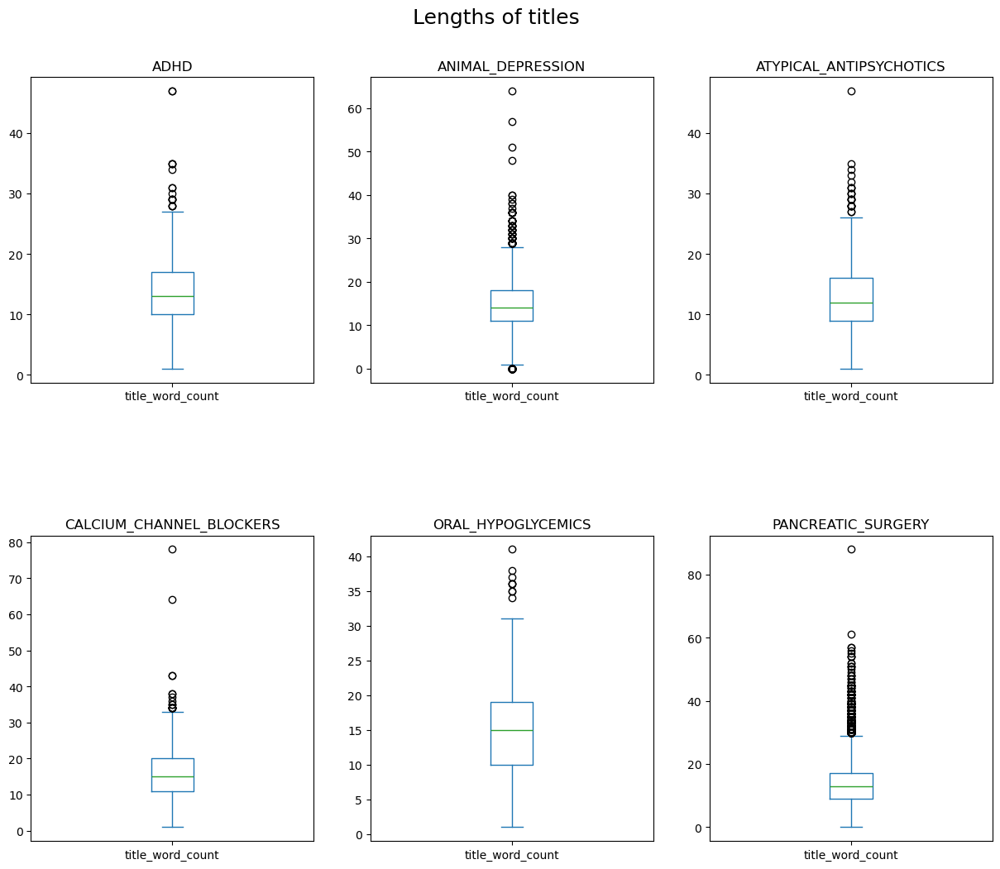

In [15]:
# create a figure to plot the distributions of the title lengths
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Lengths of titles", fontsize=18, y=0.95)

# loop through the length of tickers and keep track of index
for n, (subject, df) in enumerate(datasets_pandas.items()):
    # add a new subplot iteratively
    ax = plt.subplot(2, 3, n + 1)

    # filter df and plot on the new subplot axis
    df['title_word_count'].plot(kind='box', ax=ax)

    # chart formatting
    ax.set_title(subject.upper())
    ax.set_xlabel("")

### Lengths of Abstracts

In [16]:
# inspect the distributions for the abstract column
distributions.filter(
    pl.col('column') == 'abstract'
)

column,type,n,mean,std,min,5%,25%,50%,75%,95%,99%,max,dataset
str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str
"""abstract""","""word_count""",851,275,334,0,98,182,249,311,453,717,5411,"""adhd"""
"""abstract""","""word_count""",1993,210,253,0,0,128,210,277,376,545,5414,"""animal_depression"""
"""abstract""","""word_count""",1120,273,376,0,67,171,231,295,446,1271,5411,"""atypical_antipsychotics"""
"""abstract""","""word_count""",1218,291,295,0,49,206,277,334,463,880,4999,"""calcium_channel_blockers"""
"""abstract""","""word_count""",503,296,266,0,82,212,288,352,489,683,5190,"""oral_hypoglycemics"""
"""abstract""","""word_count""",34206,223,447,0,0,139,225,295,415,583,78903,"""pancreatic_surgery"""


In [17]:
# average the number of words in the abstract column
median_abstract_words = distributions.filter(
    pl.col('column') == 'abstract'
).select(
    pl.col('50%').median()
).to_series()[0]

print(f'Across all datasets, an abstract contains a median of {median_abstract_words} words.')

Across all datasets, an abstract contains a median of 240.0 words.


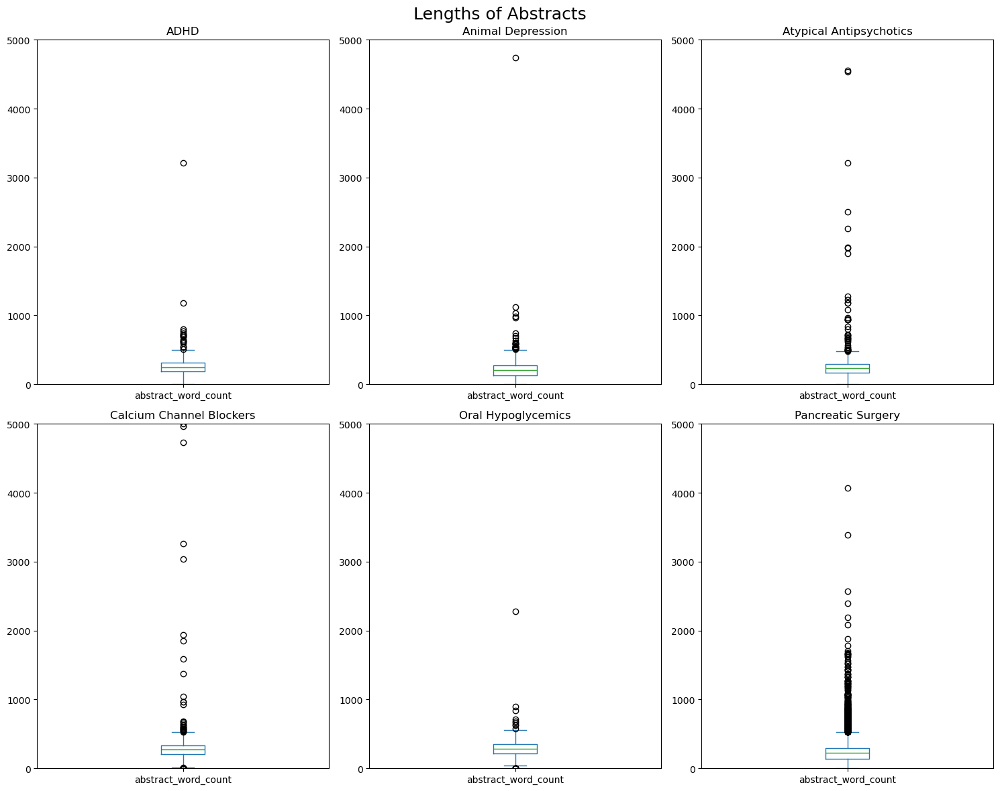

In [18]:
# create a figure to plot the distributions of the title lengths
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Lengths of Abstracts", fontsize=18)

# loop through the length of tickers and keep track of index
for n, (subject, df) in enumerate(datasets_pandas.items()):
    # add a new subplot iteratively
    ax = plt.subplot(2, 3, n + 1)

    # filter df and plot on the new subplot axis
    df['abstract_word_count'].plot(kind='box', ax=ax)

    # chart formatting
    ax.set_title(dataset_labels[n])
    ax.set_ylim(0, 5000)
    ax.set_xlabel("")

plt.tight_layout()

### Outliers: Extremely long or short texts
Filter and observe outliers, namely very short and very long abstracts, to see what they contain:

In [19]:
MIN_WORDS = 1 # minimum number of words in an abstract; 1 to exclude empty
MAX_WORDS = 40 # maximum number of words in an abstract
SAMPLE_SIZE = 20 # how many examples to display

# dataframe of very short abstracts
very_short_abstracts = all_datasets.filter(
    pl.col('abstract_word_count') >= MIN_WORDS
).filter(
    pl.col('abstract_word_count') <= MAX_WORDS
)

# create lists for printing
very_short_abstracts_list = very_short_abstracts.select(pl.col('abstract')).to_series().to_list()
very_short_abstract_length_list = very_short_abstracts.select(pl.col('abstract_word_count')).to_series().to_list()
very_short_abstract_title_list = very_short_abstracts.select(pl.col('title')).to_series().to_list()

# combine the abstract length, title, and abstract into tuples
very_short_abstract_tuples = list(zip(very_short_abstract_length_list, very_short_abstract_title_list, very_short_abstracts_list))

# print the short abstracts
print(f'{len(very_short_abstracts)} VERY SHORT ABSTRACTS FOUND.', f'Displaying {SAMPLE_SIZE} samples per dataset', sep='\n', end=f'\n{'='*250}\n\n')

# formatting to distinguish open from closed sentences
for tuple in very_short_abstract_tuples:
    text_end = 'closed sentence' if tuple[2].endswith('.') else 'OPEN sentence'
    print(f'{tuple[1]} ({tuple[0]} words - {text_end})', tuple[2], sep=f'\n\n', end=f'\n\n{'-'*250}\n\n')

256 VERY SHORT ABSTRACTS FOUND.
Displaying 20 samples per dataset

Dosing Strategies of Clozapine-Fluvoxamine Cotreatment (26 words - OPEN sentence)

Lu, Mong-Liang MD, MS; Lane, Hsien-Yuan MD, PhD; Jann, Michael W. PharmD; Chang, Wen-Ho MD Author Information

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Desmopressin for Risperidone-Induced Enuresis (19 words - closed sentence)

AbstractWe present a case report which illustrates the successful use of desmopressin for the treatment of risperidone-induced enuresis.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Stability of neurolog

In [20]:
# to filter abstracts with more than words than the threshold
LONG_ABSTRACT_THRESHOLD = 4000

long_abstracts = all_datasets.filter(
    pl.col('abstract_word_count') > LONG_ABSTRACT_THRESHOLD
)

# create lists for printing
long_abstracts_list = long_abstracts.select(pl.col('abstract')).to_series().to_list()
long_abstract_length_list = long_abstracts.select(pl.col('abstract_word_count')).to_series().to_list()
_long_abstract_title_list = long_abstracts.select(pl.col('title')).to_series().to_list()

# combine the abstract length, title, and abstract into tuples
long_abstract_tuples = list(zip(long_abstract_length_list, _long_abstract_title_list, long_abstracts_list))

# print the long abstracts
print(len(long_abstract_tuples), 'LONG ABSTRACTS FOUND.', end=f'\n{'='*250}\n\n')

# formatting to distinguish open from closed sentences
for tuple in long_abstract_tuples:
    print(f'{tuple[1]} ({tuple[0]} words)', tuple[2], sep=f'\n\n', end=f'\n\n{'-'*250}\n\n')

19 LONG ABSTRACTS FOUND.

Bupropion Sustained Release for Treatment of Tobacco Dependence (5053 words)

Tobacco use is a global pandemic. The most common pharmacological treatments of tobacco use and dependence include nicotine replacement therapy and nonnicotine medications. Bupropion sustained release (SR) is the only first-line nonnicotine medication recommended by the US Public Health Service Clinical Practice Guideline. Randomized controlled clinical trials have shown that bupropion SR doubles abstinence rates compared with placebo. Long-term treatment with bupropion SR may reduce or delay smoking relapse. Bupropion SR has an excellent adverse effect profile, although a risk exists for serious adverse effects such as seizures. The risk of serious adverse effects associated with bupropion SR can be reduced by careful selection of patients. This article reviews the evidence of efficacy and common adverse effects of bupropion SR and delineates the clinical characteristics of patients

### Conclusion: Text Lengths
Most titles have around 13.5 words, while a few titles have up to 88 words. On average, abstracts contain 240 words across all datasets. Most outliers among the abstracts are within the range between 2000 and 5000 words, while one extreme outlier contains almost 80.000 words. There are also abstracts that contain one word only.

## Duplicates
### Number of Duplicates

In [21]:
identical_entries = pl.DataFrame() # empty DataFrame to store identical entries

# columns based on which to search for duplicates
columns = [
    'doi', 
    'pubmed_id', 
    'openalex_id', 
    'webofscience_id', 
    'central_id', 
    'title'
]

# search for duplicates in each dataset
for group in all_datasets.group_by(by='dataset'):
    df = group[1]

    # search for duplicates in each column
    for column in columns:
        
        # subset of duplicate articles
        clones = df.filter(
            pl.col(column).is_not_null() # exclude empty entries
        ).filter(
            pl.col(column).is_duplicated() # find duplicates
        ).sort(
            by=column # sort by the column
        ).unique( # display each unique value only once
            subset=column,
            keep='first',
            maintain_order=True
        ).with_columns(
            pl.lit(column).alias('duplicate_column')
        )

        # append the found duplicates to the identical entries
        if len(clones) > 0:
            identical_entries = identical_entries.vstack(clones)


In [22]:
print()

In [23]:
# print a summary on duplicate articles in total and per dataset
print(f'Found {len(identical_entries)} identical entries across all datasets', 
      end=f'\n{'='*100}\n\n'
    )

# print a summary on how many duplicates there are per column
for group in identical_entries.group_by(by='dataset'):
    dataset = group[0][0] # dataset name, or subject
    dataframe = group[1] # the DataFrame itself
    
    # count the number of duplicates per column
    value_counts = dataframe['duplicate_column'].to_pandas().value_counts()

    # print the summary
    print(
        dataset, 
        'has', 
        len(dataframe),
        'identical entries by the following columns:'
    )
    print(value_counts, end='\n\n')
    

Found 530 identical entries across all datasets

atypical_antipsychotics has 4 identical entries by the following columns:
duplicate_column
title    4
Name: count, dtype: int64

pancreatic_surgery has 511 identical entries by the following columns:
duplicate_column
title              490
doi                 12
pubmed_id            8
webofscience_id      1
Name: count, dtype: int64

adhd has 1 identical entries by the following columns:
duplicate_column
title    1
Name: count, dtype: int64

oral_hypoglycemics has 4 identical entries by the following columns:
duplicate_column
title    4
Name: count, dtype: int64

calcium_channel_blockers has 1 identical entries by the following columns:
duplicate_column
title    1
Name: count, dtype: int64

animal_depression has 9 identical entries by the following columns:
duplicate_column
title          4
doi            2
openalex_id    2
pubmed_id      1
Name: count, dtype: int64



### Types of Duplicates
Through manual inspection we found that there are different types of duplicates:

#### Same article published twice
The following example shows identical articles that were published twice.

In [24]:
duplicates_same_article = [
    (pancreatic_surgery, [12250, 12322, 33375, 33376])
]

same_articles = pl.concat([
    return_rows(row[0], row[1], columns=[
        'title',
        'abstract', 
        'first_author',
        'journal', 
        'year', 
        'doi',
        'pubmed_id'
    ])
    for row in duplicates_same_article
]).sort(by='title', descending=True)

same_articles

title,abstract,first_author,journal,year,doi,pubmed_id
str,str,str,str,i64,str,i64
"""β-cell failure in type 2 diabe…","""OBJECTIVE: This article examin…","""Halban PA""","""J Clin Endocrinol Metab""",2014,"""10.1210/jc.2014-1425""",24712577
"""β-cell failure in type 2 diabe…","""OBJECTIVE: This article examin…","""Halban PA""","""Diabetes Care""",2014,"""10.2337/dc14-0396""",24812433
"""Early enteral versus total par…","""Background: Current nutritiona…",null,null,null,"""10.1016/j.hpb.2019.10.534""",null
"""Early enteral versus total par…","""Background: Current nutritiona…",null,null,null,"""10.1016/j.hpb.2019.10.1322""",null


From the metadata, such as first author, and year, it is obvious that the first two articles are duplicates. Meanwhile, these metadata are not available for the last two articles. One could therefore only aim to check for duplicates by manual search:

![alt text](duplicates.png "Title")

#### Same title but different articles
Another case are articles that share a title but are clearly distinguishable through their content, doi and literature id.

In [25]:
duplicates_different_article = [
    (oral_hypoglycemics, [178,179])
]

different_articles = pl.concat([
    return_rows(row[0], row[1], columns=[
        'title',
        'abstract', 
        'first_author',
        'journal', 
        'year', 
        'doi',
        'pubmed_id'
    ])
    for row in duplicates_different_article
]).sort(by='title', descending=True)

different_articles

title,abstract,first_author,journal,year,doi,pubmed_id
str,str,str,str,i64,str,i64
"""Oral Antihyperglycemic Therapy…","""Diabetes mellitus affects more…","""Inzucchi SE""","""JAMA""",2002,"""https://doi.org/10.1001/jama.2…",11790216
"""Oral Antihyperglycemic Therapy…","""Oral agents are the mainstay o…","""Holmboe ES""","""JAMA""",2002,"""https://doi.org/10.1001/jama.2…",11790217


#### Conclusion: Duplicate Articles
There are only a few instances of duplicate articles by any kind of id within the datasets on animal depression (5 duplicates), and pancreatic surgery (21 duplicates).

All datasets except pancreatic surgery contain either one or four articles with duplicate titles. The pancreatic surgery dataset contains 490 articles with duplicate titles.

Duplicates by id are safe to remove from the dataset. If there are no ids, it is possible to identify duplicate articles by identical titles. In the absence of further metadata, such as authors, it is however not possible to automatically identify duplicates by title only.

## Missing Data
The intention behind querying the PubMed eutils api was to fetch as much missing data as possible. The following plot visualizes a comparison of how many titles and abstracts were missing before and after the call to the api respectively:

In [26]:
# data before the call to the pubmed api
data_directory_before = '../../../../data/datasets/02_openalex'
datasets_before = data.dict_from_directory(
    data_directory_before,
    separator=',',
    type='pandas'
)

# lamba function to calculate relative amount of missing data
missing_percentages = lambda x: round(x.isna().mean() * 100, 2)

# calculate the number of missing titles and abstracts

# before the pubmed api
missings_before = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'pubmed': 'before'
}for subject, df in datasets_before.items())

# after the pubmed api
missings_after = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'pubmed': 'after'
}for subject, df in datasets_pandas.items())

# combine the two dataframes with missing data
missings_joint = pd.concat([missings_before, missings_after])

# one line each before and after pubmed
missings_melted = pd.melt(
    missings_joint,
    id_vars=['dataset', 'pubmed'],
    value_vars=['title', 'abstract'],
    var_name='type',
    value_name='missing'
)

# calculate the present data out of the missings
missings_melted = pl.DataFrame(missings_melted).with_columns(
    (pl.lit(100) - pl.col('missing')).alias('present')
)

# sort the data to not overlap the plots
missings_melted =  missings_melted.sort(by=['pubmed'], descending=False)

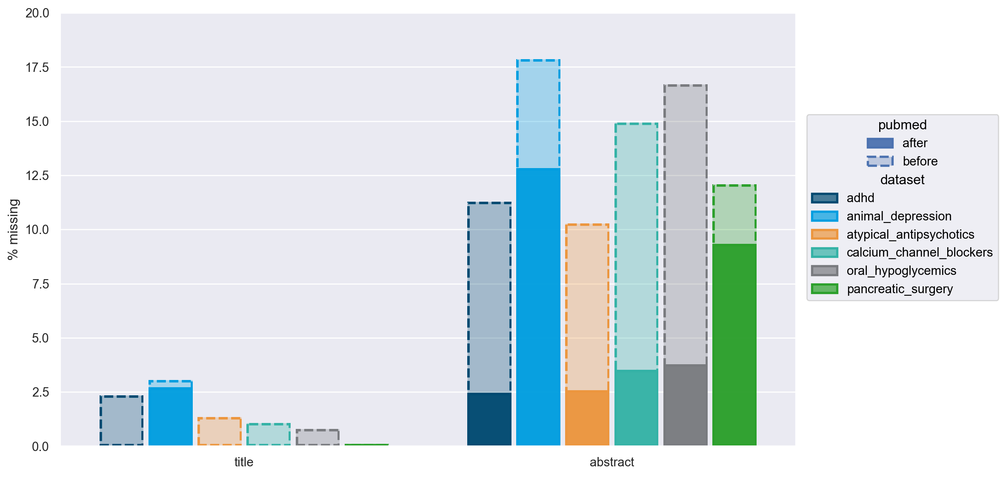

In [27]:
# plot the reduction in missing data
(
    so.Plot(data=missings_melted, x='type', y='missing', alpha='pubmed', edgestyle='pubmed', color='dataset', text='missing')
    .add(so.Bar(edgewidth=2), so.Dodge(by=['color'], gap=0.1))
    .label(x='', y='% missing', legend='Test')
    .scale(color=COLOR_CODES)
    .layout(size=(10, 6))
    .limit(y=(0,20))
)

#### Conclusion: Missing Data
The call to the PubMed interface reduced the amount of missing titles and abstracts across all datasets.

All but the dataset on animal depression, result in no missing titles after the api call. The reduction in missing abstracts ranged from three to fifteen percent.

## Noise

### Non-English Languages

#### Amount of non-English Texts

##### Titles

In [28]:
# filter non-english titles
non_english_titles = all_datasets.filter(
    pl.col('language_title') != 'en'
)

In [29]:
# calculate the percentage of non-english titles
percentage = round(len(non_english_titles) / len(all_datasets), 4) * 100

# print the percentage and the distribution of non-english titles
print('Fast-langdetect detected',
      len(non_english_titles),
      f'({percentage:.2f}%)', 
      'non-english titles in the datasets'
    )

# distribution of non-english titles
non_english_titles.select('dataset').to_pandas().value_counts()

Fast-langdetect detected 578 (1.45%) non-english titles in the datasets


dataset                 
pancreatic_surgery          478
calcium_channel_blockers     24
adhd                         22
animal_depression            21
atypical_antipsychotics      19
oral_hypoglycemics           14
Name: count, dtype: int64

##### Abstracts

In [30]:
# filter non-english abstracts
non_english_abstracts = all_datasets.filter(
    pl.col('language_abstract') != 'en'
)

In [31]:
percentage

1.4500000000000002

In [32]:
# calculate the percentage of non-english abstracts
percentage = round(len(non_english_abstracts) / len(all_datasets), 4) * 100

# print the percentage and the distribution of non-english abstracts
print('Fast-langdetect detected',
      len(non_english_abstracts),
      f'({percentage:.2f}%)', 
      'non-english abstracts in the datasets'
    )

# distribution of non-english abstracts
non_english_abstracts.select('dataset').to_pandas().value_counts()

Fast-langdetect detected 35 (0.09%) non-english abstracts in the datasets


dataset                 
animal_depression           14
pancreatic_surgery           8
adhd                         5
atypical_antipsychotics      4
calcium_channel_blockers     4
Name: count, dtype: int64

#### Samples of non-English Texts

#### German

In [33]:
abstracts_german = [
    (adhd, 759),
    (animal_depression, [266, 848, 1162, 1250, 1521, 1644, 1919])
]

print_abstracts(abstracts_german)

Die Periduralanalgesie und die patientenkontrollierte intravenöse Analgesie (PCA) werden meist als Goldstandards der postoperativen Schmerztherapie einander gegenübergestellt. In dieser Studie sollte 

1. Endoxan hemmt, insbesondere während der Erstimmunisierung, die Ausbildung von Antikörpern gegen Brucella abortus; 6-Mercaptopurin hat einen weitaus geringeren Effekt. 2. Beide Substanzen vermindern

Die Neuroleptika Melleril ®, Sordinol ® und Fluanxol ® senken bei Mäusen dosisabhängig Körpertemperatur und O2-Verbrauch und erhöhen bei i.p. Applikation vor sub-letaler oder letaler Bestrahlung mit γ

Es wird gezeigt, dass Phythämagglutinin (PHA) die Antikörperbildung gegenBrucella abortus bei der Maus merklich herabsetzt, aber nur dann, wenn PHA vor dem Antigenstimulus verabreicht wird und die imm

Piperonylbutoxyd, Methylendioxylanilin, Methyleugenol, Safranol und Vanillylamin bewirken eine additive Hemmung der Funktion mikrosomaler Enzyme in Mäusen, wenn sie zusammen in Dosen verabreic

#### French

In [34]:
abstracts_french = [
    (animal_depression, 968),
    (calcium_channel_blockers, 590)
]

print_abstracts(abstracts_french)

La toxoplasmose acquise est une infection parasitaire qui touche l’ensemble des cellules cérébrales lors de la phase aiguë. Il paraît donc surprenant que cette infection soit sans conséquence sur le f

Tester l’hypothèse que le sulfate de magnésium (SO4Mg), habituellement administré pour protéger le myocarde et réduire l’incidence des arythmies en chirurgie cardiaque, était en mesure de contrôler le



#### Spanish

In [35]:
abstracts_spanish = [
    (animal_depression, 675),
    (calcium_channel_blockers, 348)
]

print_abstracts(abstracts_spanish)

El Sulpiride in vitro a la concentración de 1×10−2 M disminuye el consumo de Oxígeno en cortes de cerebro de rata. El exceso de potasio o ausencia de calcio en el medio de incubación, no modifican est

Mediante este estudio se ha pretendido: a) identificar y caracterizar los problemasrelacionados con la medicación (reacciones adversas, fracasos terapéuticos relacionados con ladosis e intoxicaciones)



#### Portuguese, Italian, Japanese

In [36]:
abstracts_other_languages = [
    (adhd, 785), # Portuguese
    (animal_depression, 421), # Italian
    (atypical_antipsychotics, 99) # Japanese
]

print_abstracts(abstracts_other_languages)

A sindrome de hiperatividade com déficit de atenção (SHDA) constitui distúrbio comum na infância, podendo advir de fatores exógenos ou endógenos, os quais são responsáveis por comprometimento cerebral

Inoculando in embrioni di pollo di 4 giorni di sviluppo un inibitore dell'anidrasi carbonica (4, 5-Dicloro-1, 3-Benzendisolfonamide) o un suo derivato inattivo nel quale un atomo di idrogeno dei 2 gru

シグマ受容体拮抗物質に関する最近の研究成果を精神分裂病治療薬との関連でまとめた．選択的シグマ1受容体拮抗物質であるNE-100はphencyclidine(PCP)誘発異常行動改善作用および認知障害改善作用を有するが，ドパミンアゴニスト誘発行動には影響を及ぼさず，カタレプシー惹起性も認められない．NE-100の作用機序はN-methyl-D-aspartate(NMDA)/PCP受容体イオンチャネ



#### Special Case: Multilingual
An especially challenging case is a bilingual abstract, that contains both German and English text:

In [37]:
abstract_bilingual = (pancreatic_surgery, 200)
print_abstracts([abstract_bilingual], character_limit=None)

Zusammenfassung Hintergrund Die chronische Pankreatitis (CP) ist eine haufige Ursache fur stationare Einweisungen in die Gastroenterologie und ist mit einer reduzierten Lebensqualitat und Lebenserwartung assoziiert. Die Deutsche Gesellschaft fur Gastroenterologie, Verdauungs- und Stoffwechselerkrankungen (DGVS) hat in der aktuellen S3-Leitlinie Pankreatitis die neuesten Erkenntnisse von Epidemiologie, Diagnostik und Behandlung der akuten und chronischen Pankreatitis zusammengefasst. Hier werden praxisrelevante Aspekte fur die chronische Pankreatitis zusammengefasst. Ergebnisse Die haufigste Ursache der CP ist der chronische Alkoholabusus. Weitere Ursachen sind die hereditare Pankreatitis, die Autoimmunpankreatitis, ein Hyperparathyreoidismus und idiopathische Formen der CP. Neben der klassischen hereditaren Pankreatitis (PRSS1-Mutation), sind in den letzten Jahren eine Vielzahl an Genen identifiziert worden, die mit einem erhohten Risiko fur die Entwicklung einer idiopathischen CP asso

#### Conclusion: Non-English Texts
A variety of languages other than English is present across the titles and abstracts. However, the language detection has an accuracy of roughly only 75 % and misclassifies English texts. The language detection seems to struggle especially with short samples of text and medical terms.

According to the language detection, roughly one percent of all the articles have a title in a Non-English language. Non-English abstracts are present in less than one percentile of all artiles.

Correcting misclassified languages requires manual screening.

## List of Authors
Some entries contain a list of authors where there should be an abstract:

In [38]:
# some examples of abstracts that contain lists of authors
abstracts_authors = [
    (calcium_channel_blockers, [599, 863]),
    (atypical_antipsychotics, [917, 976] )
]

print_abstracts(abstracts_authors)

van den Toren, E. Wout; de Vries, Rob J. M.; Portegies, Mireille C. M.; Blanksma, Paul K.; van Gilst, Wiek H.*; Hillege, Hans J.; van Veldhuisen, Dirk J.; Lie, Kong I. Author Information

Grandi, Anna M.; Bignotti, Massimo; Gaudio, Giovanni; Zanzi, Paolo; Guasti, Luigina; Venco, Achilla Author Information

Faustman, William O. PhD; Ringo, David L. MD, PhD; Lauriello, John MD; Lim, Kelvin O. MD; Pfefferbaum, Adolf MD; Bardgett, Mark E. PhD; Csernansky, John G. MD Author Information

Kern, Robert S. PhD; Marshall, Barringer D. MD; Kuehnel, Timothy G. PhD; Mintz, Jim PhD; Hayden, Jeffrey L. BA; Robertson, Mary Jane MS; Green, Michael F. PhD Author Information



In some cases, this could be retraced to faulty entries in the OpenAlex index:

![alt text](openalex_authors.png "Title")

## HTML

In [39]:
# some examples of abstracts that contain HTML elements
abstracts_html = [
    (calcium_channel_blockers, 24),
    (adhd, [456])
]

print_abstracts(abstracts_html)

<h3>Objective:</h3> To report an atypical presentation of Lance-Adams Syndrome presenting from severe respiratory depression rather than cardiac arrest and to highlight the importance of distinguishin

<b><i>Objective:</i></b> To evaluate the efficacy and safety of risperidone in children and adults with Tourette syndrome. <b><i>Methods:</i></b> This was an 8-week, randomized, double-blind, placebo-



## Markdown

In [40]:
# examples of abstracts that contain markdown elements
abstract_markdown = [
    (calcium_channel_blockers, 44)
]

print_abstracts(abstract_markdown)

### Table of contents

It is important that the medical profession play a significant role in critically evaluating the use of diagnostic procedures and therapies in the management or prevention of 



## Special Characters

In [41]:
# examples of abstracts that contain special characters
abstract_special_characters = [
    (animal_depression, 190)
]

print_abstracts(abstract_special_characters)

✓ Adult Fisher 344 rats were subjected to a unilateral impact to the dorsal cortex above the hippocampus at 3.5 m/second, resulting in a 2-mm cortical depression. This caused severe cortical damage an



## Abbreviations

In [42]:
# examples of abstracts that contain abbreviations
abstracts_abbreviations = [
    (pancreatic_surgery, [1, 6, 249])
]

print_abstracts(abstracts_abbreviations)

The importance of diagnostic endoscopic retrograde cholangiography (ERCP) has dramatically decreased owing to the development of less invasive techniques such as ultrasonography, computed tomography, 

INTRODUCTION: Pancreaticopleural fistula (PPF) is a rare but serious complication of pancreatic disorders. As the clinical presentations of PPF are often deceptive, it can cause a delay in the timely 

Intravenous radionuclide cholescintigraphy (IVRC) provides a very specific picture for choledochal cysts. However, the clinical significance of the non-visualization of the gall-bladder (GB) activity 



## Paragraph Labels

In [43]:
# examples of abstracts that contain paragraph labels (e.g., "Objective")
abstract_paragraph = [
    (atypical_antipsychotics, 24)
]

print_abstracts(abstract_paragraph)

RATIONALE: The atypical neuroleptic clozapine induces specific electroencephalogram changes, which have not been investigated using the technique of magnetoencephalography (MEG).
OBJECTIVE: The prese



## Incomplete Abstracts
Some abstracts are incomplete and end mid-sentence, which becomes visible when printing only their last 250 characters:

In [44]:
# examples of abstracts that are incomplete
abstracts_incomplete = [
    (pancreatic_surgery, [11, 19, 701])
]

for row in abstracts_incomplete:
    abstracts = return_rows(row[0], row[1])
    for abstract in abstracts['abstract']:
        print(abstract[-250:], end='\n\n')

18 to 70 years operated for elective Whippleâ??s pancreaticoduodenectomy from January 2020 to March 2022 in the department of surgical gastroenterology at Osmania general hospital 2.All patients who underwent Neo Adjuvant chemotherapyPrior to surgery

agent used posttransplant and inversely correlated with length of time from transplant. Infants with a history of intrauterine growth retardation are more likely to have characteristics of type 2 diabetes later in life, illustrating the importance of

i‐appendiceal phlegmon, abscess or diffuse peritonitis (Grade 5 and 6 of the 2017 American Association for the Surgery on Trauma Grading System) 3. Discrete pancreatic infections (abscess, infected pseudocyst) 4. Patients will be included in the tria



#### Conclusion: Noise
There are different kinds of noise present in the data. That noise originates from the original sources, possibly because of mixed up data fields or formatting errors.

It is possible to detect and remove non-English abstracts. Other noise such as special characters, or markups like markdown or html can be removed using regular expressions or dedicated libraries. 

Detecting and handling other types of noises, such as lists of authors in place of abstracts, incomplete abstracts, or abbreviations is not as trivial on the other hand

## Word Frequencies (Word Cloucs)
Create and plot a word cloud for each dataset to visualize words which frequently appear throughout them and thus become especially relevant for supervised machine learning models:

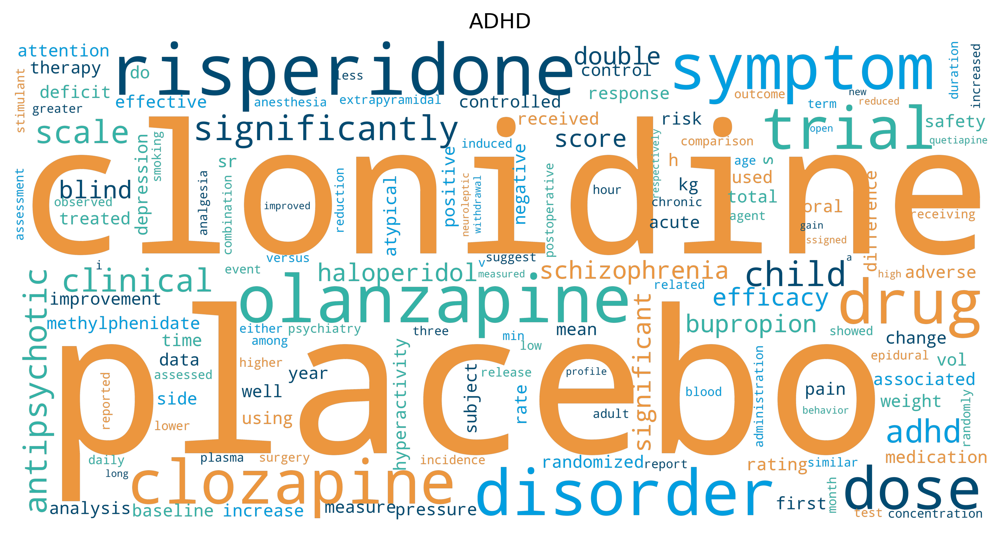

In [45]:
adhd_cloud = word_cloud_from_dataframe(adhd, columns=['title', 'abstract'])
plot_word_cloud(adhd_cloud, 'ADHD')

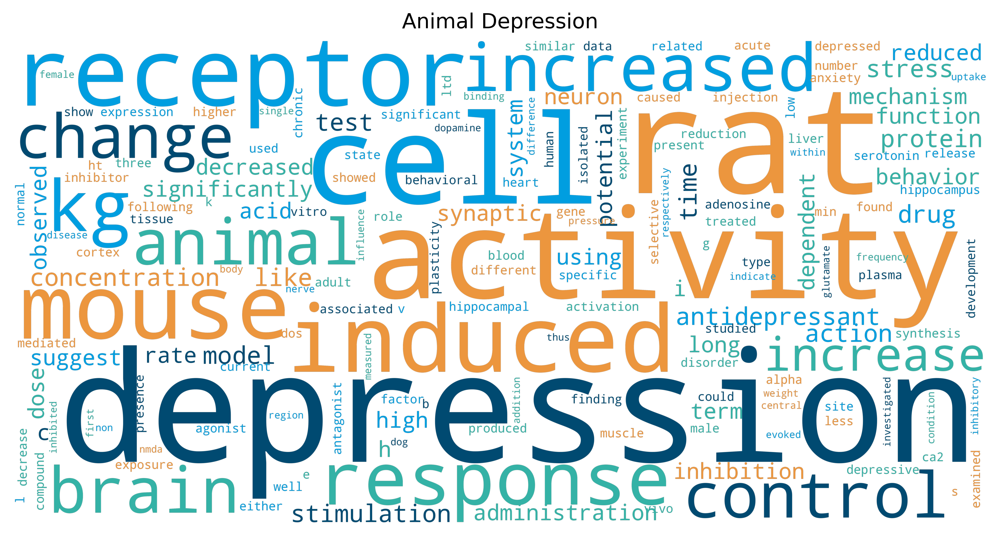

In [46]:
animal_depression_cloud = word_cloud_from_dataframe(animal_depression, columns=['title', 'abstract'])
plot_word_cloud(animal_depression_cloud, 'Animal Depression')

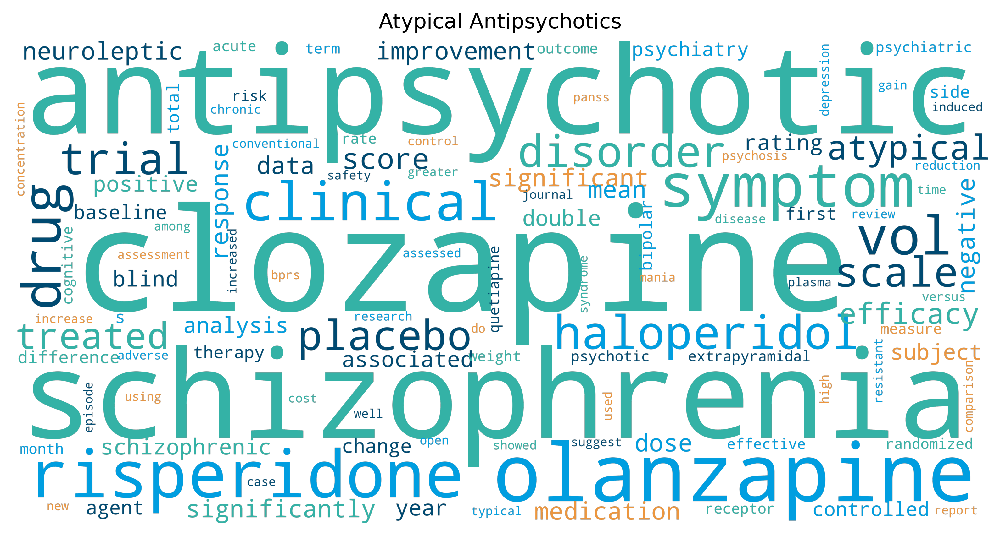

In [47]:
atypical_antipsychotics_cloud = word_cloud_from_dataframe(atypical_antipsychotics, columns=['title', 'abstract'])
plot_word_cloud(atypical_antipsychotics_cloud, 'Atypical Antipsychotics')

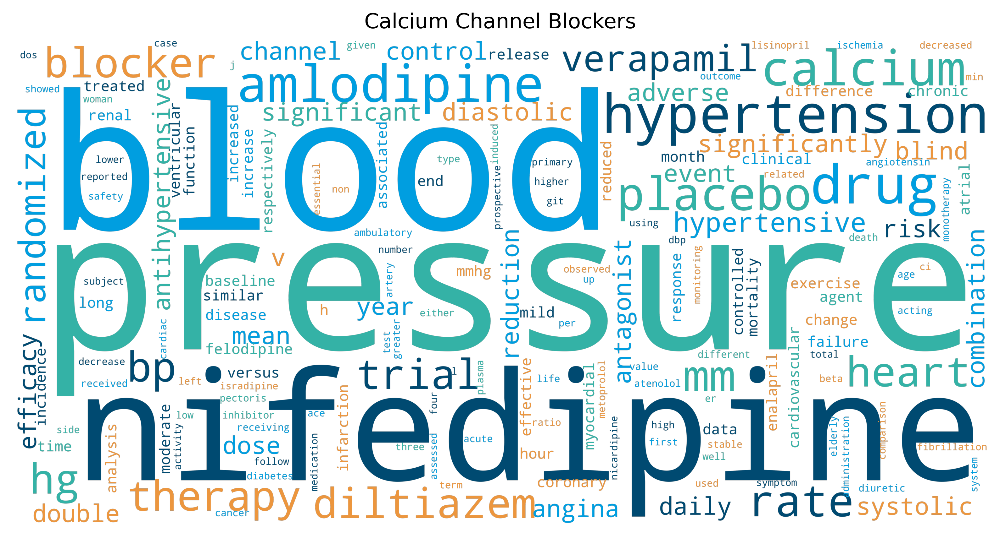

In [48]:
calcium_channel_blockers_cloud = word_cloud_from_dataframe(calcium_channel_blockers, columns=['title', 'abstract'])
plot_word_cloud(calcium_channel_blockers_cloud, 'Calcium Channel Blockers')

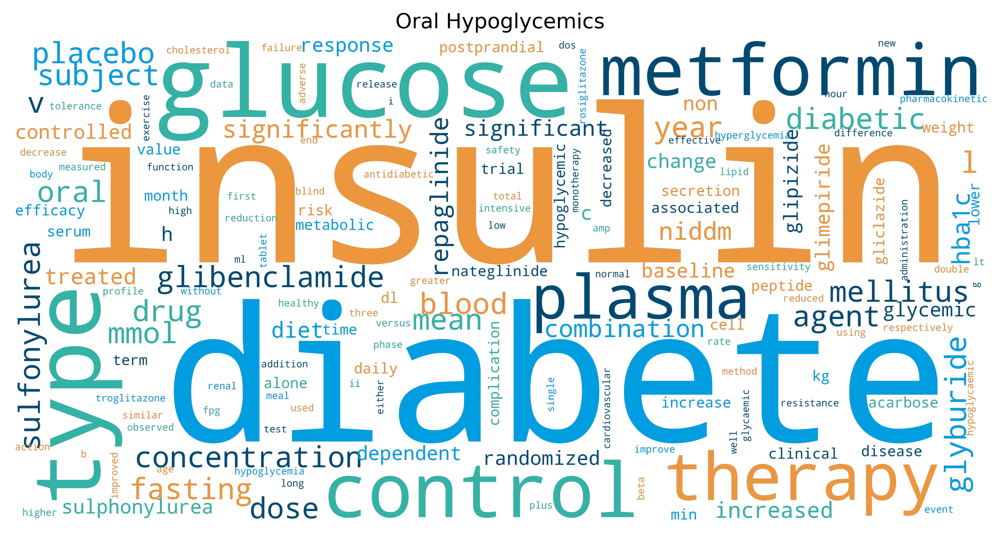

In [49]:
oral_hypoglycemics_cloud = word_cloud_from_dataframe(oral_hypoglycemics, columns=['title', 'abstract'])
plot_word_cloud(oral_hypoglycemics_cloud, 'Oral Hypoglycemics')

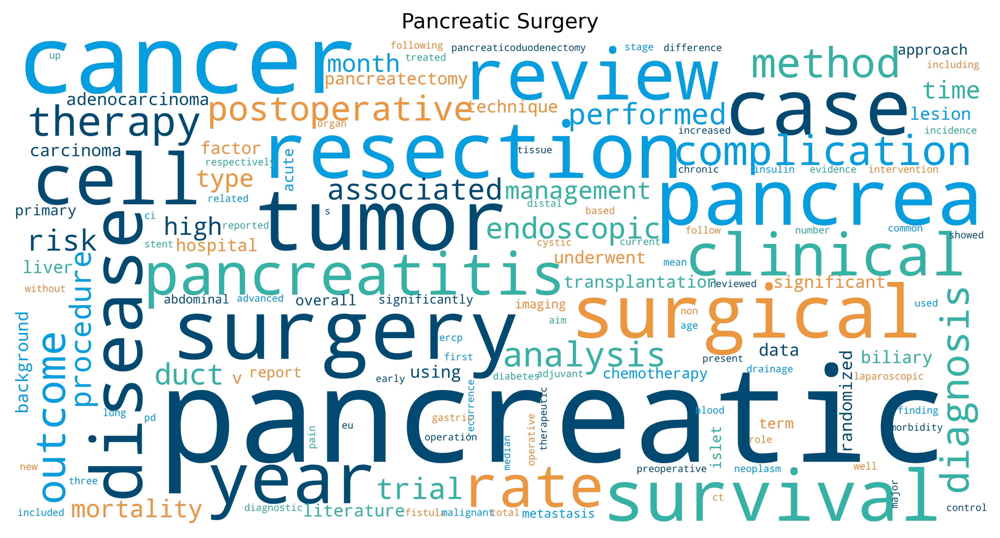

In [50]:
pancreatic_surgery_cloud = word_cloud_from_dataframe(pancreatic_surgery, columns=['title', 'abstract'])
plot_word_cloud(pancreatic_surgery_cloud, 'Pancreatic Surgery')

### Subplot
Embed all wordclouds within one figure

In [51]:
wordclouds = {
    'ADHD': adhd_cloud,
    'Animal Depression': animal_depression_cloud,
    'Atypical Antipsychotics': atypical_antipsychotics_cloud,
    'Calcium Channel Blockers': calcium_channel_blockers_cloud,
    'Oral Hypoglycemics': oral_hypoglycemics_cloud,
    'Pancreatic Surgery': pancreatic_surgery_cloud
}

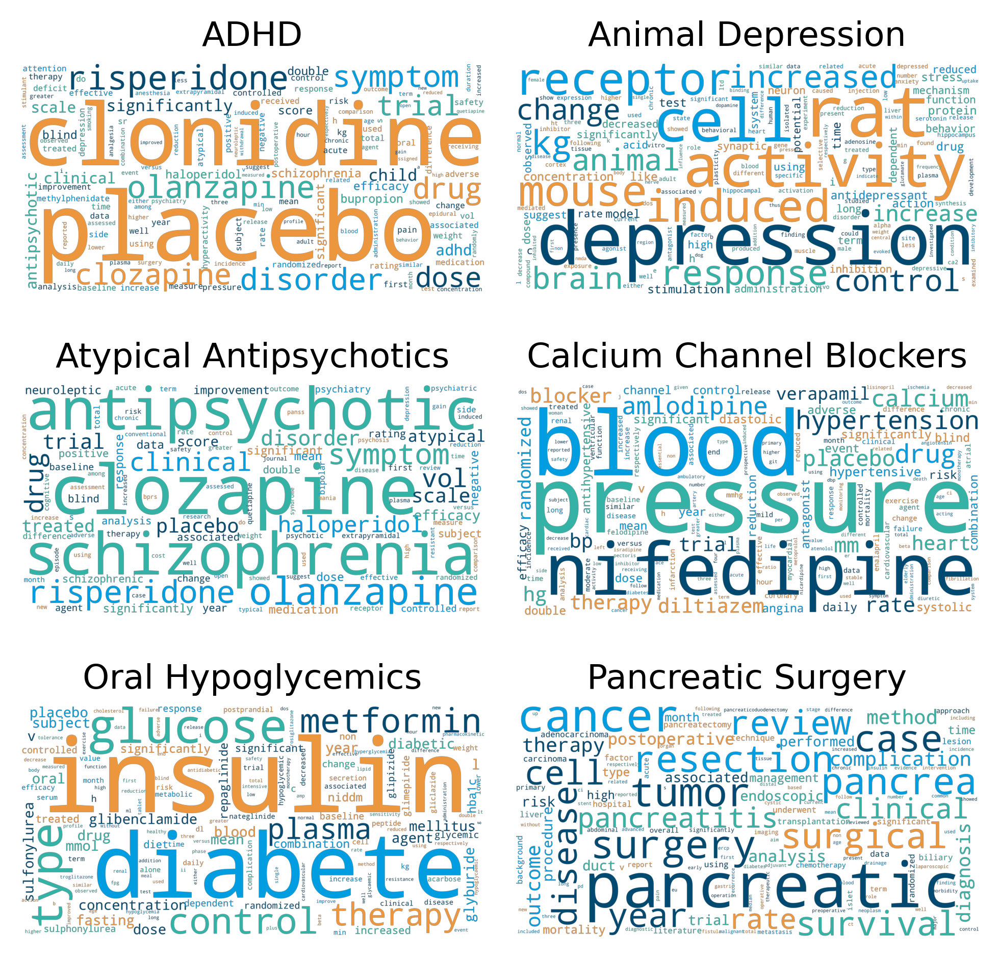

In [52]:
# Create a figure with 3 rows and 2 columns, and set the dpi for higher quality
fig, axes = plt.subplots(3, 2, figsize=(5,5), dpi=400)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each word cloud in the corresponding subplot
for ax, (title, wordcloud) in zip(axes, wordclouds.items()):
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(title)
    ax.axis('off')  # Hide the axes

# Adjust layout
plt.tight_layout()
#plt.subplots_adjust(wspace=None, hspace=None)  # Adjust wspace and hspace to reduce gaps

plt.show()

#### Conclusion: Word Frequencies
The wordclouds indicate that filtering out common uninformative stopwords results in a collection of terms characteristic to the subjects of the datasets.